## America has gone through a turbulent period in the last decade, including events like Trump’s election, the mass protests about police violence stemming from George Floyd’s death, and COVID.
## How has public safety, discrimination, and violence evolved in Washington DC, especially in the context of these events? Are all people equally safe in DC, or only certain people? Has safety for certain groups changed in any meaningful ways over time? What about across different locations in DC?
## To that end, we explore datasets about Washington DC relating to sustainable development goal 16: [peace, justice, and strong institutions](https://sdg-tracker.org/peace-justice)

   * **Prevalence of all types of violence: 16.1.3**
       * Definition: Indicator 16.1.3 is the proportion of population subjected to (a) physical violence, (b) psychological violence and (c) sexual violence in the previous 12 months.

       * Goal: Significantly reduce all forms of violence and related death rates across all countries by 2030.
   * **Increase public safety: 16.1.4**
       * Definition: Indicator 16.1.4 is the proportion of population that feel safe walking alone around the area they live.

       * Goal: Significantly reduce all forms of violence and related death rates across all countries by 2030.
   * **Public discrimination: 16.B.1**
       * Definition: Indicator 16.B.1 is the proportion of population reporting having personally felt discriminated against or harassed in the previous 12 months on the basis of a ground of discrimination prohibited under international human rights law.
       * Goal: Promote and enforce non-discriminatory laws and policies for sustainable development across all countries by 2030.

## Datasets in use
### Hate crime dataset
* https://mpdc.dc.gov/node/1334781
* DC hate crime instances from 2012-2021 full years
* contains the district (which is a police district), and not a ZIP code.
** Police district geojson is here https://github.com/benbalter/dc-maps/blob/master/maps/police-districts-mpd.geojson

### Use of force dataset
* https://mpdc.dc.gov/node/1582621
* only 2020
* contains the district (which is a police district), and not a ZIP code.
** Police district geojson is here https://github.com/benbalter/dc-maps/blob/master/maps/police-districts-mpd.geojson

## currently testing these datasets
* Traffic stops 2019(partial)-2020 - https://opendata.dc.gov/datasets/DCGIS::stop-incidents/explore
* Felony sentences? - https://opendata.dc.gov/datasets/DCGIS::felony-sentences/explore

## other potential datasources
### many other DC map data
* https://github.com/benbalter/dc-maps

### ZIP codes if needed for further analysis
* ZIP codes geojson https://github.com/benbalter/dc-maps/blob/master/maps/zip-codes.geojson

### demographics 2020 data from census tracts
* geojson and csv of data table https://opendata.dc.gov/datasets/DCGIS::census-tracts-in-2020/explore?location=38.890695%2C-77.031102%2C11.93&showTable=true
* shows demographic breakdown
* SUMMARY of demographics of census tracts: https://opendata.dc.gov/apps/demographic-characteristics-of-dc-census-tracts/explore
* economic description of census tracts: https://opendata.dc.gov/apps/economic-characteristics-of-dc-census-tracts/explore
* social characteristics of census tracts: https://opendata.dc.gov/apps/social-characteristics-of-dc-census-tracts/explore

### [Overall demographics](https://www.census.gov/quickfacts/DC)
* 46% white, 46% black

In [1]:
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 2nd dataset: Police use of force from 2020 in DC

In [2]:
# load 2020 use of force dataset
force = pd.read_csv('UofF_external_2020_public_214.csv')

In [3]:
force.head()

,IS_ID,IncidentDate,IncidentTime,IncidentDistrict,CaseStatus,DateClosed,uof_type,disposition,department_action,Officer_id,OfficerAssignment,OfficerGender,OfficerRace,year_force,subject_age,subject_race,subject_gender,serious,CD,animal
0,902a2368ae1c486481892a1ca58eda5f,1/1/2020,1:25,6D,Closed,1/28/2020,Pointing of a Firearm,Tracking Only,NaN,a1220a5c-1a7b-4cc5-9774-8be4531f8c58,6D,Male,Black/African American,4,26,Black/African American,Male,0.0,0,0
1,6747630f3f3e4449a04ca0ca984a9b84,1/1/2020,2:20,7D,Closed,2/24/2020,Tactical Takedown: No Injury or Complaint of Pain,Tracking Only,NaN,bd982c85-3d86-4420-aaff-d66a474a9f17,7D,Male,Black/African American,7,36,Black/African American,Male,0.0,0,0
2,6747630f3f3e4449a04ca0ca984a9b84,1/1/2020,2:20,7D,Closed,2/24/2020,Tactical Takedown: No Injury or Complaint of Pain,Tracking Only,NaN,94f98225-6e8c-423a-bff2-8346758719fb,7D,Male,White/Caucasian,15,36,Black/African American,Male,0.0,0,0
3,6747630f3f3e4449a04ca0ca984a9b84,1/1/2020,2:20,7D,Closed,2/24/2020,Tactical Takedown: No Injury or Complaint of Pain,Tracking Only,NaN,305f353a-760c-434f-bac8-b7b65a95087e,7D,Male,White/Caucasian,2,36,Black/African American,Male,0.0,0,0
4,6747630f3f3e4449a04ca0ca984a9b84,1/1/2020,2:20,7D,Closed,2/24/2020,Hand & Straight Strikes,Justified - Within Department Policy,NaN,760981c0-ea5a-4624-a75a-9c8ec351498a,7D,Male,Black/African American,14,36,Black/African American,Male,0.0,0,0


### Preprocessing

In [4]:
# convert to datetime
force['IncidentDate'] = pd.to_datetime(force['IncidentDate'] )

# Remove the D in the districts since the geojsons only need the number
force['IncidentDistrict'] = force['IncidentDistrict'].str.replace('D', '') # remove D

### View basic stats about the dataset.
Demographics of DC: 46.0% white, 46.0% black, 11.3% Hispanic

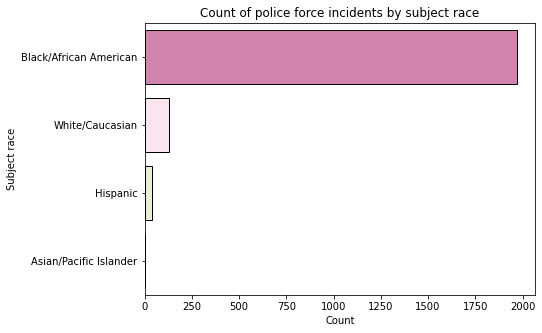

In [5]:
fig, ax = plt.subplots(figsize=(7, 5))
ax = sns.countplot(y="subject_race", data=force, palette='PiYG',
                   order = force['subject_race'].value_counts().index, edgecolor='black')
ax.set(title = 'Count of police force incidents by subject race', xlabel='Count', ylabel='Subject race');

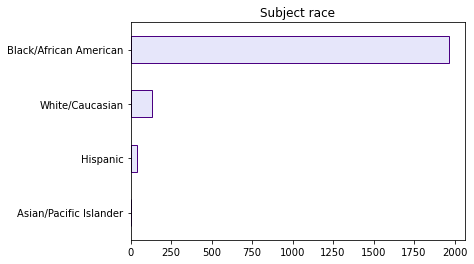

In [6]:
force.subject_race.value_counts(ascending=True).plot(kind='barh', color='lavender',edgecolor='indigo', title='Subject race');

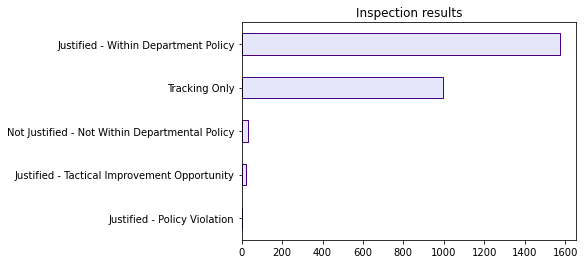

In [7]:
force.disposition.value_counts(ascending=True).plot(kind='barh', color='lavender',edgecolor='indigo', title = 'Inspection results');

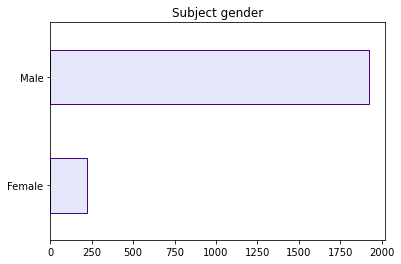

In [8]:
force.subject_gender.value_counts(ascending=True).plot(kind='barh', color='lavender',edgecolor='indigo', title='Subject gender');

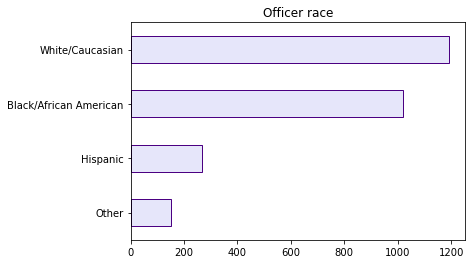

In [9]:
force.OfficerRace.value_counts(ascending=True).plot(kind='barh', color='lavender',edgecolor='indigo', 
                                                    title='Officer race');

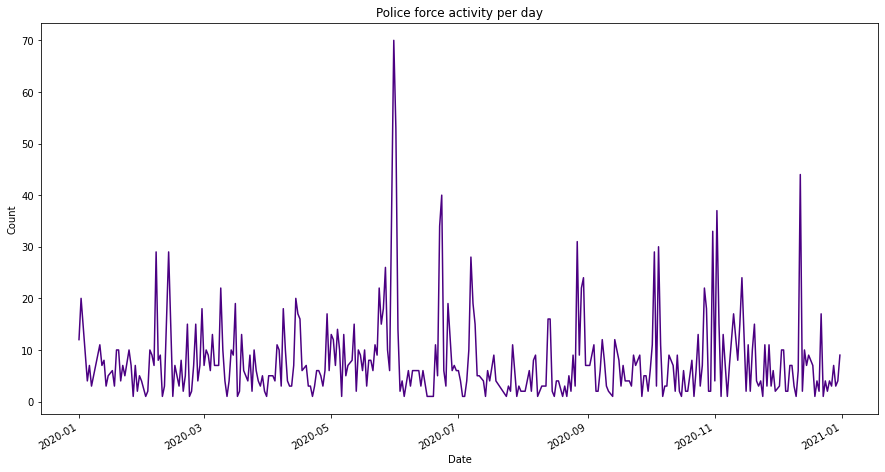

In [10]:
force['IncidentDate'].value_counts().plot(kind='line', figsize=(15,8), title='Police force activity per day',
                                         color='indigo', ylabel='Count', xlabel='Date');

We can see there are various spikes, especially in June. This is likely related to the George Floyd protests across the country which occurred from 28 May - 23 June in Washington, DC. Let's check the top dates below.

In [11]:
force['IncidentDate'].value_counts(ascending=False).head(15)

2020-05-31    70
2020-06-01    53
2020-12-12    44
2020-06-23    40
2020-11-02    37
2020-06-22    34
2020-10-31    33
2020-08-27    31
2020-10-05    30
2020-10-03    29
2020-02-07    29
2020-02-13    29
2020-07-07    28
2020-05-27    26
2020-08-30    24
Name: IncidentDate, dtype: int64

4 of the top 6 days with police force occurred during the George Floyd protests.

The third highest was 12 December - what was that? And also 2 November.

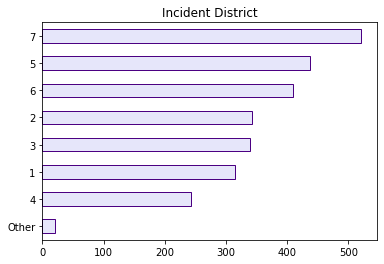

In [12]:
force.IncidentDistrict.value_counts(ascending=True).plot(kind='barh', color='lavender',edgecolor='indigo', 
                                                    title='Incident District');

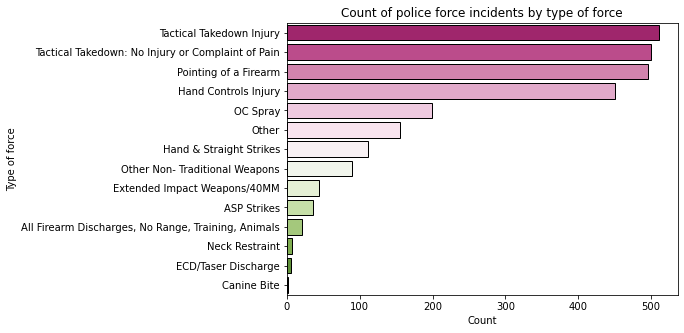

In [13]:
fig, ax = plt.subplots(figsize=(7, 5))
ax = sns.countplot(y="uof_type", data=force, palette='PiYG',
                   order = force['uof_type'].value_counts().index, edgecolor='black')
ax.set(title = 'Count of police force incidents by type of force', xlabel='Count', ylabel='Type of force');

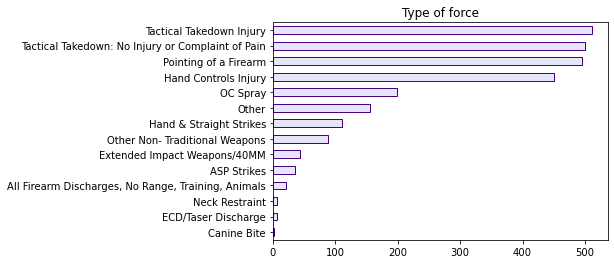

In [14]:
force.uof_type.value_counts(ascending=True).plot(kind='barh', color='lavender',edgecolor='indigo', 
                                                    title='Type of force');

Let's see if different methods were used for different races or by different races of officers?

In [15]:
force.groupby(['uof_type','OfficerRace']).size().sort_values(ascending=False).to_frame()

0
uof_type                                           OfficerRace                
Pointing of a Firearm                              White/Caucasian         257
Tactical Takedown: No Injury or Complaint of Pain  Black/African American  222
Tactical Takedown Injury                           White/Caucasian         215
                                                   Black/African American  212
Tactical Takedown: No Injury or Complaint of Pain  White/Caucasian         188
Hand Controls Injury                               White/Caucasian         187
Pointing of a Firearm                              Black/African American  183
Hand Controls Injury                               Black/African American  170
OC Spray                                           White/Caucasian         117
Other                                              White/Caucasian          73
Hand Controls Injury                               Hispanic                 64
Other                                              Black/African American   63
Tactical Takedown: No Injury or Complaint of Pain  Hispanic                 58
Other Non- Traditional Weapons                     White/Caucasian          55
Hand & Straight Strikes                            Black/African American   53
OC Spray                                           Black/African American   51
Tactical Takedown Injury                           Hispanic                 49
Hand & Straight Strikes                            White/Caucasian          40
Pointing of a Firearm                              Hispanic                 39
Tactical Takedown Injury                           Other                    35
Tactical Takedown: No Injury or Complaint of Pain  Other                    32
Extended Impact Weapons/40MM                       White/Caucasian          29
Hand Controls Injury                               Other                    29
Other Non- Traditional Weapons                     Black/African American   24
OC Spray                                           Hispanic                 20
ASP Strikes                                        Black/African American   18
Pointing of a Firearm                              Other                    17
ASP Strikes                                        White/Caucasian          14
Hand & Straight Strikes                            Hispanic                 13
OC Spray                                           Other                    11
Extended Impact Weapons/40MM                       Black/African American   10
Other                                              Hispanic                 10
All Firearm Discharges, No Range, Training, Ani... White/Caucasian          10
Other                                              Other                     9
Other Non- Traditional Weapons                     Hispanic                  6
All Firearm Discharges, No Range, Training, Ani... Black/African American    6
Hand & Straight Strikes                            Other                     5
Extended Impact Weapons/40MM                       Other                     4
Other Non- Traditional Weapons                     Other                     4
ECD/Taser Discharge                                Black/African American    3
All Firearm Discharges, No Range, Training, Ani... Hispanic                  3
Neck Restraint                                     White/Caucasian           3
ECD/Taser Discharge                                White/Caucasian           3
Neck Restraint                                     Black/African American    3
Canine Bite                                        White/Caucasian           2
All Firearm Discharges, No Range, Training, Ani... Other                     2
ASP Strikes                                        Other                     2
                                                   Hispanic                  2
Neck Restraint                                     Hispanic                  1
Extended Impact Weapons/40MM                    

In [16]:
force.groupby(['subject_race','uof_type']).size().sort_values(ascending=False).to_frame()

0
subject_race           uof_type                                               
Black/African American Tactical Takedown Injury                            444
                       Tactical Takedown: No Injury or Complaint of Pain   440
                       Pointing of a Firearm                               410
                       Hand Controls Injury                                381
                       Hand & Straight Strikes                             101
                       OC Spray                                             70
                       Other                                                60
White/Caucasian        Tactical Takedown: No Injury or Complaint of Pain    39
                       Pointing of a Firearm                                36
Black/African American ASP Strikes                                          33
White/Caucasian        Tactical Takedown Injury                             23
Black/African American All Firearm Discharges, No Range, Training, Ani...   17
White/Caucasian        Hand Controls Injury                                 17
Hispanic               Pointing of a Firearm                                16
                       Tactical Takedown: No Injury or Complaint of Pain    11
Black/African American Neck Restraint                                        5
White/Caucasian        Hand & Straight Strikes                               4
                       OC Spray                                              3
Hispanic               Tactical Takedown Injury                              3
Asian/Pacific Islander Pointing of a Firearm                                 3
Black/African American ECD/Taser Discharge                                   3
Hispanic               Hand Controls Injury                                  2
                       Hand & Straight Strikes                               2
White/Caucasian        Other                                                 2
                       Extended Impact Weapons/40MM                          2
Black/African American Extended Impact Weapons/40MM                          2
White/Caucasian        Other Non- Traditional Weapons                        1
                       Neck Restraint                                        1
Asian/Pacific Islander OC Spray                                              1
White/Caucasian        ECD/Taser Discharge                                   1
                       All Firearm Discharges, No Range, Training, Ani...    1
                       ASP Strikes                                           1
Hispanic               Other                                                 1
                       ECD/Taser Discharge                                   1
Black/African American Canine Bite                                           1
Hispanic               Neck Restraint                                        1

In [17]:
# groupby different order
force.groupby(['uof_type','subject_race']).size().sort_values(ascending=False).to_frame()

,,0
uof_type,subject_race,
Tactical Takedown Injury,Black/African American,444
Tactical Takedown: No Injury or Complaint of Pain,Black/African American,440
Pointing of a Firearm,Black/African American,410
Hand Controls Injury,Black/African American,381
Hand & Straight Strikes,Black/African American,101
OC Spray,Black/African American,70
Other,Black/African American,60
Tactical Takedown: No Injury or Complaint of Pain,White/Caucasian,39
Pointing of a Firearm,White/Caucasian,36


Look at more info about this later. Black people had more Tactical Takedown Injuries than the rest, but they also comprise most the population of the dataset.

In [18]:
force.groupby(['uof_type','subject_gender']).size().sort_values(ascending=False).to_frame()

,,0
uof_type,subject_gender,
Tactical Takedown: No Injury or Complaint of Pain,Male,441
Tactical Takedown Injury,Male,423
Pointing of a Firearm,Male,419
Hand Controls Injury,Male,345
Hand & Straight Strikes,Male,100
OC Spray,Male,70
Other,Male,58
Hand Controls Injury,Female,55
Tactical Takedown: No Injury or Complaint of Pain,Female,51


### Maps

In [19]:
# make a dataframe to count up the crime types per district
force_count = force['IncidentDistrict'].value_counts().to_frame().reset_index()
force_count = force_count.rename(columns={"index": "DISTRICT", "IncidentDistrict": "Count"})

In [21]:
# load file
import json
with open('police-districts-mpd.geojson') as f:
    dc_pd = json.load(f)

In [22]:
# view the graph
import plotly.express as px
fig = px.choropleth_mapbox(force_count, geojson=dc_pd, locations="DISTRICT", color='Count',
                           featureidkey="properties.DISTRICT",
                           color_continuous_scale="sunset",
                           range_color=(0, 550),
                           mapbox_style="carto-positron",
                           zoom=10, center = {"lat": 38.9072, "lon": -77.0369},
                           opacity=0.5,
                           labels={'Count':'Count'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()